### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku (`cv2.threshold` odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [2]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from typing import Literal
import warnings

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania. W jaki sposób ustalisz wartość progu? Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

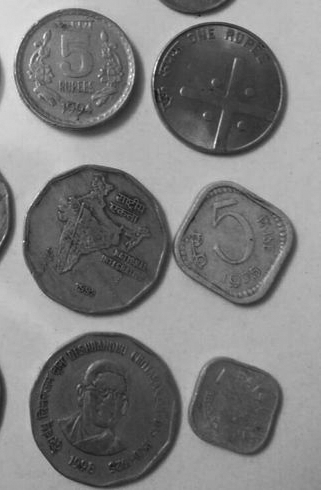

In [4]:
# 1A
monety_szare = cv2.imread('../Dane1-4/Monety_szare.bmp')
monety_szare_grayscale = cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB)
Image.fromarray(monety_szare_grayscale)

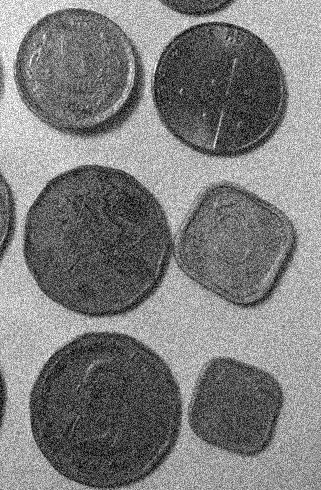

In [20]:
# 1B
monety_szare_szum = cv2.imread('../Dane1-4/Monety_szare_szum.bmp')
monety_szare_szum_grayscale = cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB)
Image.fromarray(monety_szare_szum_grayscale)

Rozwiązanie części 1A:

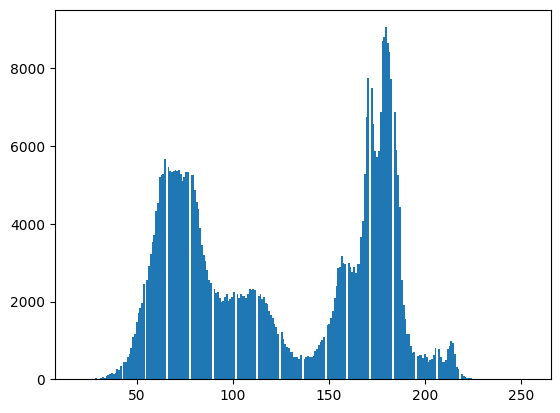

In [16]:
plt.hist(monety_szare_grayscale.flatten(), bins=255);

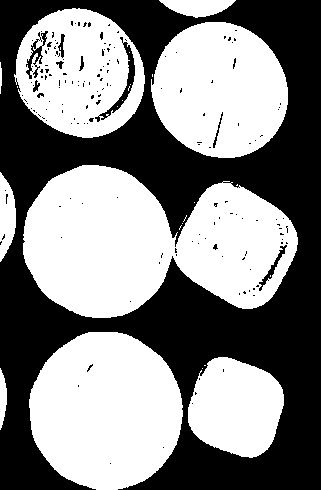

In [17]:
(threshold, monety_szare_grayscale_threshold) = cv2.threshold(monety_szare_grayscale, 130, 255, cv2.THRESH_BINARY_INV)
Image.fromarray(monety_szare_grayscale_threshold)

Rozwiązanie części 1B:


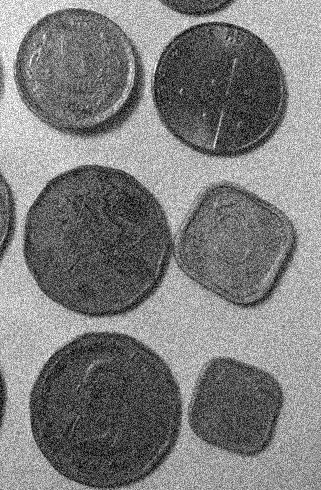

In [23]:
Image.fromarray(monety_szare_szum_grayscale)

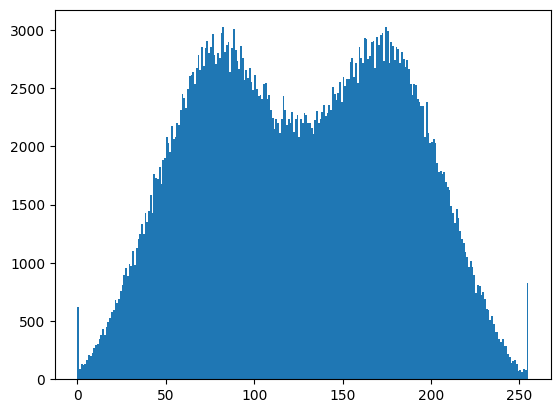

In [24]:
plt.hist(monety_szare_szum_grayscale.flatten(), bins=255);

Sprawdzenie działania poprzedniej metody - zwykłe progowanie

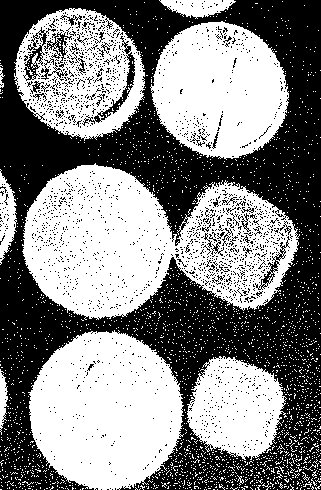

In [118]:
(threshold, monety_szare_szum_grayscale_threshold) = cv2.threshold(monety_szare_szum_grayscale, 130, 255, cv2.THRESH_BINARY_INV)
Image.fromarray(monety_szare_szum_grayscale_threshold)

In [101]:
def blur_and_threshold(src: np.ndarray, kernel_size: tuple[int, int], threshold: int, blur_method: Literal['gaussian', 'median'] ='gaussian') -> tuple[np.ndarray, np.ndarray]:
    blured = cv2.GaussianBlur(src, kernel_size, cv2.BORDER_DEFAULT) if blur_method == 'gaussian' else cv2.medianBlur(src, kernel_size[0])
    (threshold, blured_threshold) = cv2.threshold(blured, threshold, 255, cv2.THRESH_BINARY_INV)
    return blured, blured_threshold

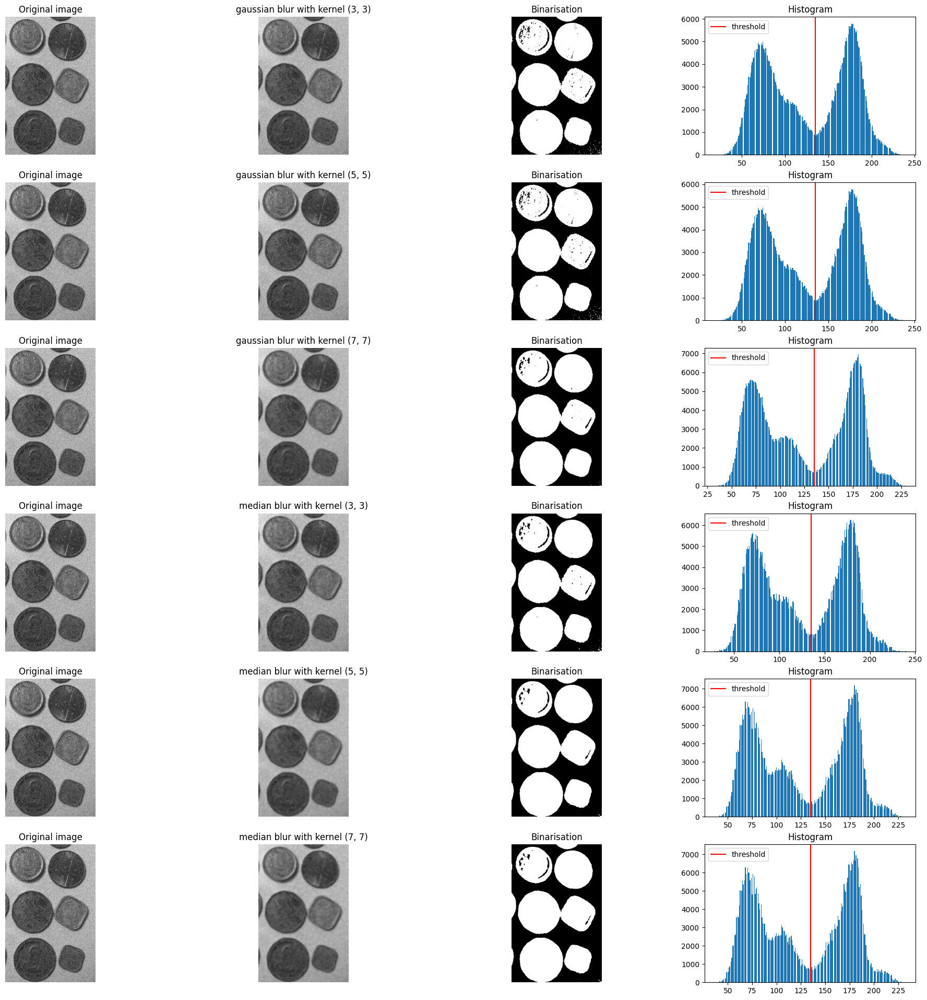

In [117]:
kernel_sizes = [(3, 3), (5, 5), (7, 7)]
methods = ['gaussian', 'median']
nrows = len(kernel_sizes) * len(methods)
thresholds = [135, 135, 135, 135, 135, 135]

fig, axes = plt.subplots(nrows, 4, figsize=(24, 4*nrows))

for i, ax in enumerate(axes):
    blured, thresholded = blur_and_threshold(monety_szare_szum_grayscale, kernel_sizes[i // 2], thresholds[i], methods[i // 3])
    ax[0].imshow(monety_szare_szum_grayscale)
    ax[0].axis('off')
    ax[0].set_title(f'Original image')
    
    ax[1].imshow(blured)
    ax[1].axis('off')
    ax[1].set_title(f'{methods[i // 3]} blur with kernel {kernel_sizes[i % 3]}')

    ax[2].imshow(thresholded)
    ax[2].axis('off')
    ax[2].set_title('Binarisation')

    ax[3].hist(blured.flatten(), bins=255)
    ax[3].axvline(x=thresholds[i], color='r', label='threshold')
    ax[3].legend()
    ax[3].set_title('Histogram')

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Posłuż się kształtem histogramu dla wybranej składowej.

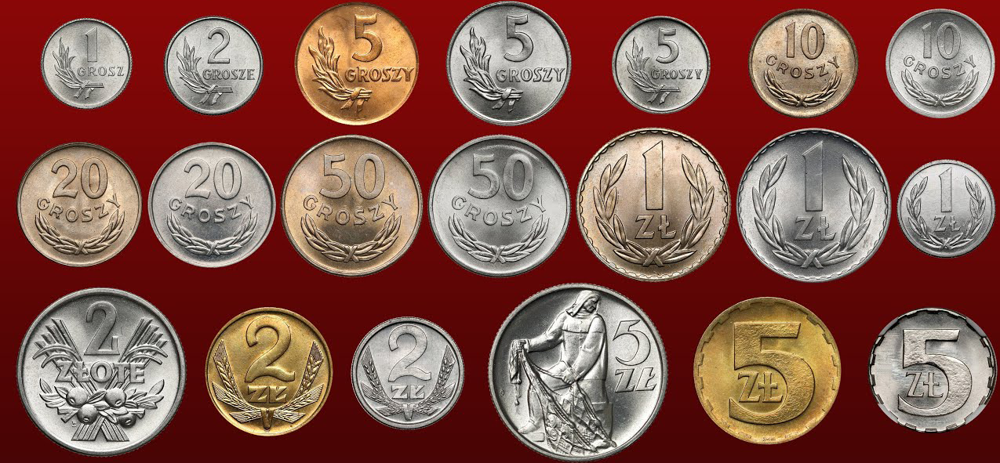

In [5]:
# 2A
monety_kolor = cv2.imread('../Dane1-4/Monety_kolor.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

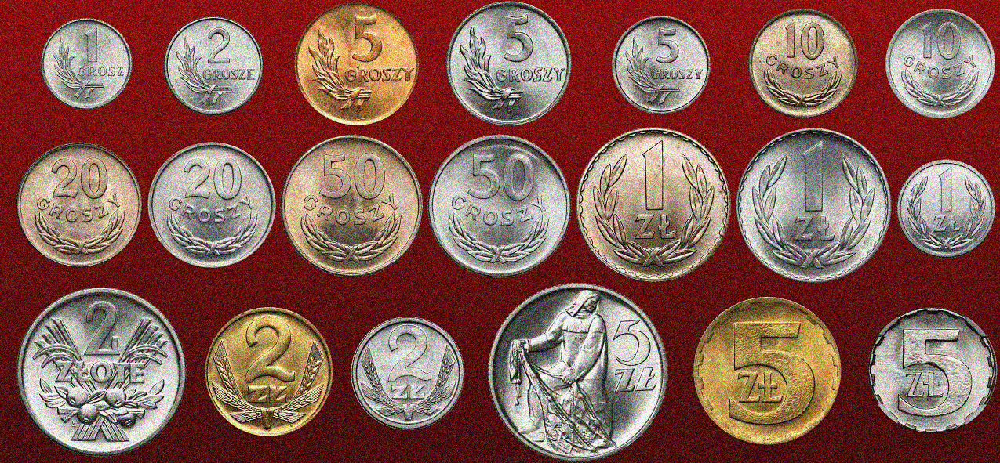

In [3]:
# 2B
monety_kolor_szum = cv2.imread('../Dane1-4/Monety_kolor_szum.bmp')
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

In [6]:
monety_kolor_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)
monety_kolor_szum_hsv = cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2HSV)

def threshold_channel(src, channel, threshold):
    cimg = cv2.split(src)[channel]
    T, T_img = cv2.threshold(cimg, threshold, 255, cv2.THRESH_BINARY_INV)
    return cimg, T_img, T

def hsv_comparison(src, thresholds):
    channels = 'HSV'
    fig, axes = plt.subplots(3, 3, figsize=(18, 12))
    for i, ax in enumerate(axes):
        cimg, T_img, T = threshold_channel(src, i, thresholds[i])

        ax[0].imshow(cimg, cmap='gray')
        ax[0].set_title(f'Channel: {channels[i]}')
        ax[0].axis('off')

        ax[1].imshow(T_img, cmap='gray')
        ax[1].set_title(f'Binary image')
        ax[1].axis('off')

        ax[2].hist(cimg.flatten(), bins=255)
        ax[2].axvline(x=thresholds[i], color='r', label='threshold')
        ax[2].legend()

    plt.show()

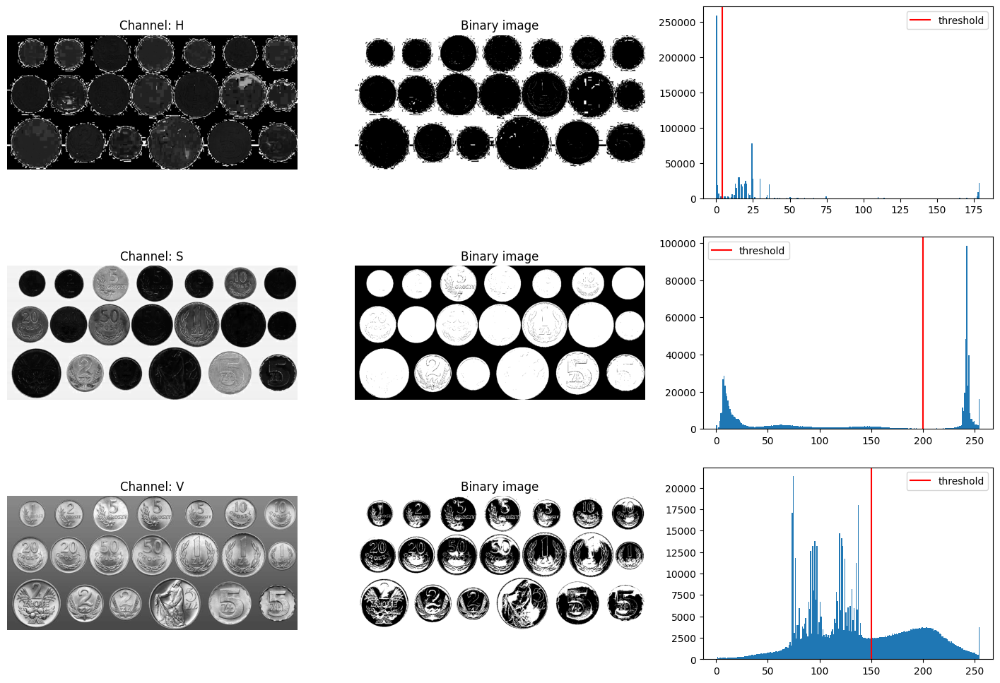

In [17]:
hsv_comparison(monety_kolor_hsv, [4, 200, 150])

Rozwiązanie części 2B:


In [123]:
def hsv_comparison_with_blur(src, kernel_size, thresholds):
    blured_img = cv2.GaussianBlur(src, kernel_size,  cv2.BORDER_DEFAULT)
    hsv_blured_img = cv2.cvtColor(blured_img, cv2.COLOR_RGB2HSV)
    hsv_img = cv2.cvtColor(src, cv2.COLOR_RGB2HSV)

    channels = 'HSV'
    fig, axes = plt.subplots(3, 4, figsize=(24, 12))
    for i, ax in enumerate(axes):
        cimg, _, _ = threshold_channel(hsv_img, i, thresholds[i])
        cimg_blured, T_img, _ = threshold_channel(hsv_blured_img, i, thresholds[i])

        ax[0].imshow(cimg, cmap='gray')
        ax[0].set_title(f'Channel: {channels[i]} (original)')
        ax[0].axis('off')

        ax[1].imshow(cimg_blured, cmap='gray')
        ax[1].set_title(f'Channel: {channels[i]} (blured)')
        ax[1].axis('off')

        ax[2].imshow(T_img, cmap='gray')
        ax[2].set_title(f'Binary image')
        ax[2].axis('off')

        ax[3].hist(cimg_blured.flatten(), bins=255)
        ax[3].axvline(x=thresholds[i], color='r', label='threshold')
        ax[3].legend()

    plt.show()

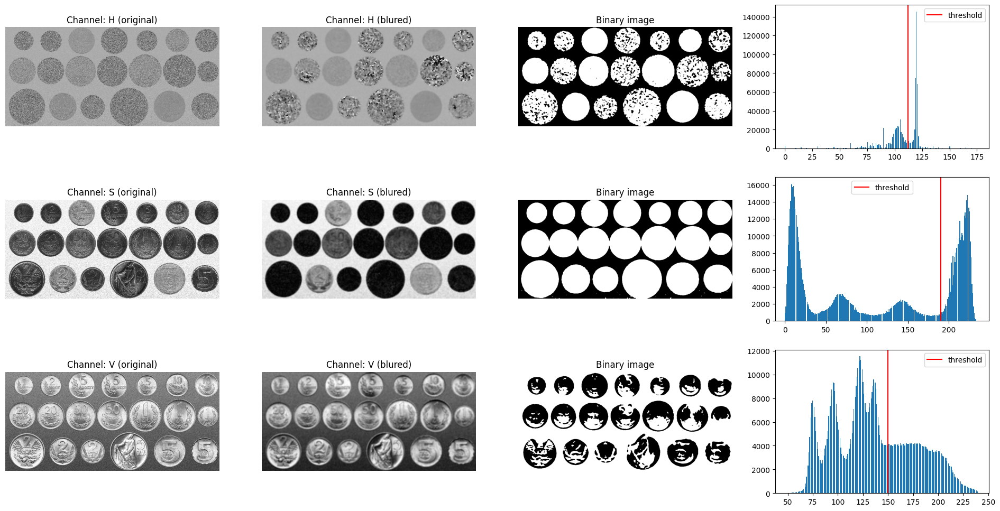

In [143]:
hsv_comparison_with_blur(monety_kolor_szum, (11, 11), [112, 190, 150])

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

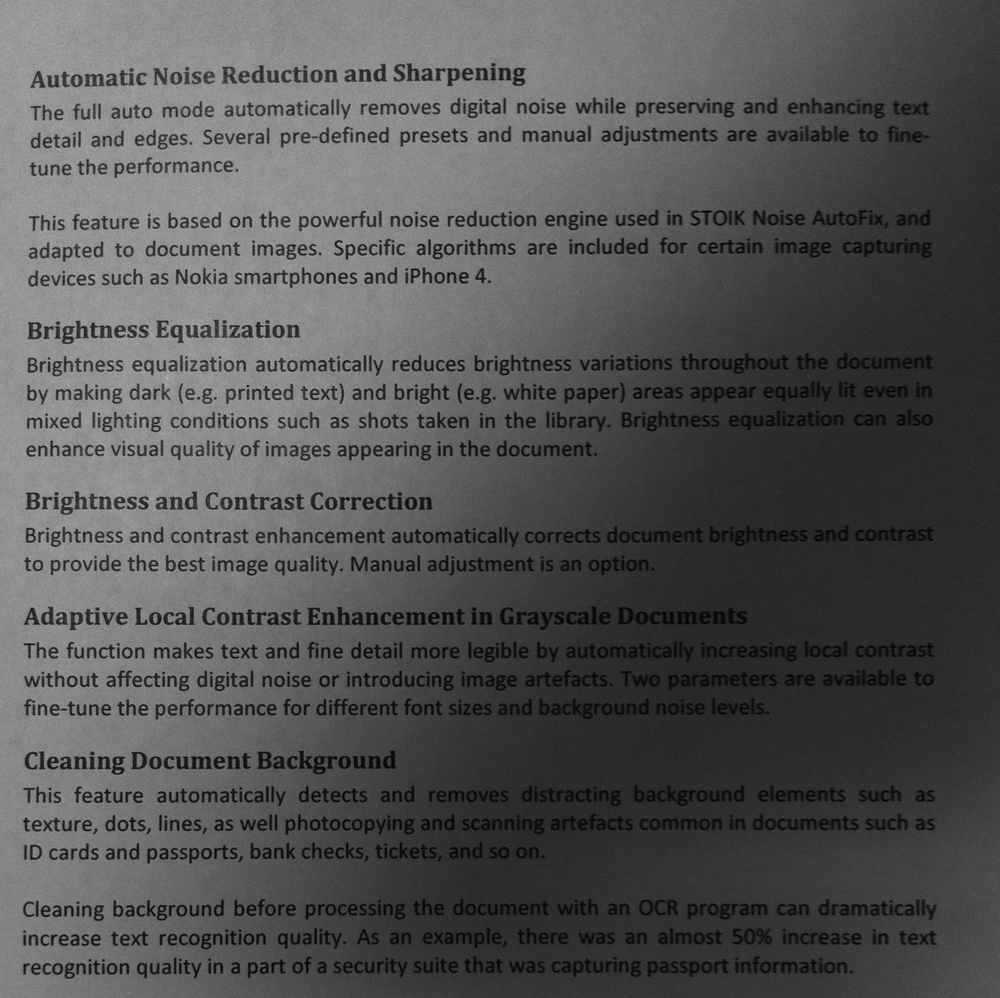

In [144]:
tekst = cv2.imread('../Dane1-4/Tekst1.bmp')
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

In [170]:
def otsu_threshold(img: np.ndarray):

    hist, bin_edges = np.histogram(img.flatten(), bins=256)
    hist = hist / hist.sum()
    bin_mids = (bin_edges[:-1] + bin_edges[1:]) / 2

    w1 = np.cumsum(hist)
    w2 = np.cumsum(hist[::-1])[::-1]
    
    with warnings.catch_warnings():
        warnings.filterwarnings('ignore', r'invalid value encountered in divide')
        mean1 = np.cumsum(hist * bin_mids) / w1
        mean2 = (np.cumsum((hist * bin_mids)[::-1]) / w2[::-1])[::-1]

    inter_class_variance = w1[:-1] * w2[1:] * (mean1[:-1] - mean2[1:]) ** 2
    index_of_max_val = np.argmax(inter_class_variance)
    threshold = bin_mids[:-1][index_of_max_val]
    return threshold


def otsu_local(src: np.ndarray, kernel_size: int):
    h, w = src.shape

    h_pad = kernel_size - (h % kernel_size)
    w_pad = kernel_size - (w % kernel_size)

    padded_img = cv2.copyMakeBorder(src, 0, h_pad, 0, w_pad, cv2.BORDER_REPLICATE)
    new_h, new_w = padded_img.shape

    for h in range(0, new_h, kernel_size):
        for w in range(0, new_w, kernel_size):
            view = padded_img[h:(h + kernel_size), w:(w + kernel_size)]
            _, view_thresholded = cv2.threshold(view, otsu_threshold(view), 255, cv2.THRESH_BINARY)
            padded_img[h:(h + kernel_size), w:(w + kernel_size)] = view_thresholded
    
    return src, padded_img


In [174]:
def plot_otsu(src: np.ndarray, kernel_sizes: list[int]):
    fig, axes = plt.subplots(1, ncols=len(kernel_sizes), figsize=(6 * len(kernel_sizes), 6))

    for ax, ks in zip(axes, kernel_sizes):
        _, otsued = otsu_local(src, ks)
        ax.imshow(otsued, cmap='gray')
        ax.axis('off')
        ax.set_title(f'Kernel size = {ks}')
        ax.add_patch(patches.Rectangle((0, 0), ks, ks, linewidth=1, edgecolor='r', facecolor='none'))

    plt.show()

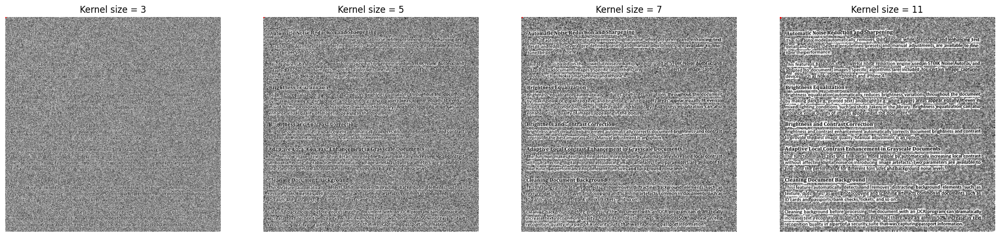

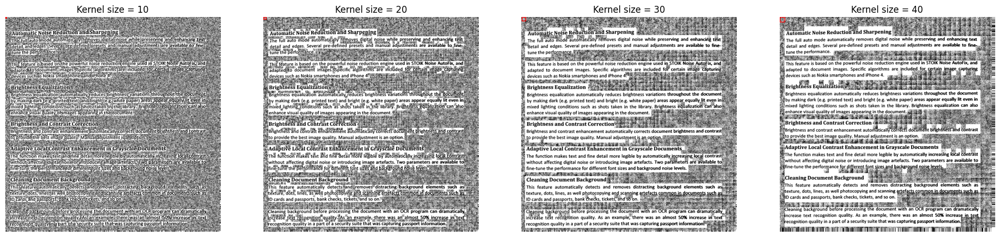

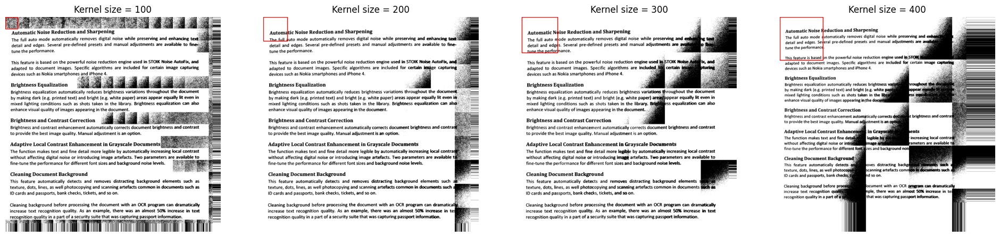

In [176]:
text_gray = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)
plot_otsu(text_gray, [3, 5, 7, 11])
plot_otsu(text_gray, [10, 20, 30, 40])
plot_otsu(text_gray, [100, 200, 300, 400])